In [1]:
# Matplotlib forms basis for visualization in Python
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# We will use the Seaborn library
import seaborn as sns
sns.set()
# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

ModuleNotFoundError: No module named 'matplotlib'

In [2]:
df = pd.read_csv(r"D:\University\3-2\3211\Lab-4\Telecom Churn.csv")

In [3]:
 df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


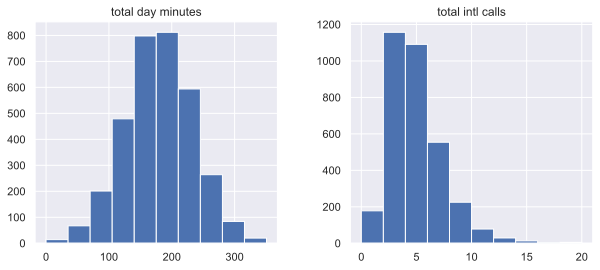

In [4]:
features = ["total day minutes", "total intl calls"]
df[features].hist(figsize=(10, 4));

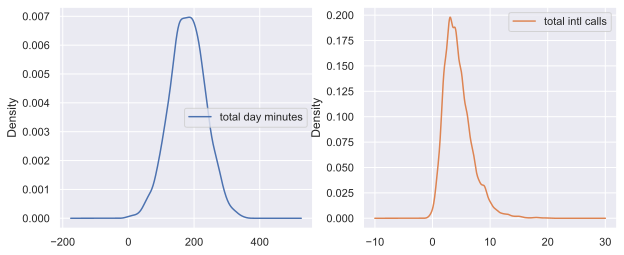

In [5]:
 df[features].plot(kind="density", subplots=True, layout=(1, 2), sharex=False, figsize=(10, 4));


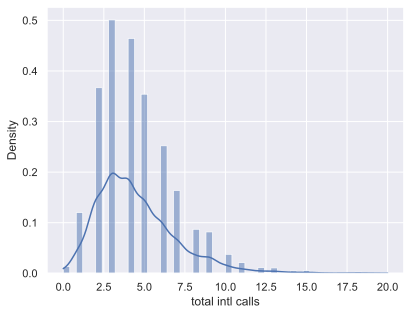

In [6]:
 sns.histplot(df["total intl calls"], kde=True, stat="density");

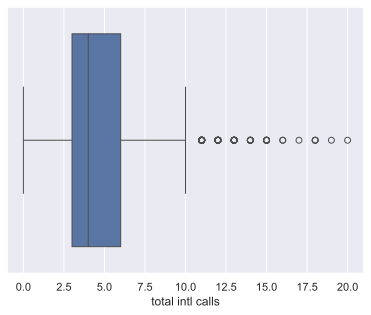

In [7]:
sns.boxplot(x="total intl calls", data=df);

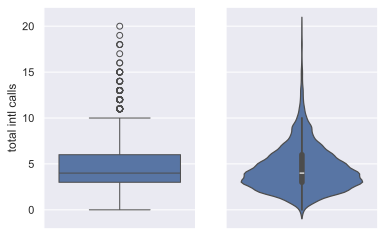

In [8]:
 _, axes = plt.subplots(1, 2, sharey=True, figsize=(6, 4))
 sns.boxplot(data=df["total intl calls"], ax=axes[0])
 sns.violinplot(data=df["total intl calls"], ax=axes[1]);

In [9]:
 df[features].describe()

,total day minutes,total intl calls
count,3333.000000,3333.000000
mean,179.775098,4.479448
std,54.467389,2.461214
min,0.000000,0.000000
25%,143.700000,3.000000
50%,179.400000,4.000000
75%,216.400000,6.000000
max,350.800000,20.000000


In [10]:
 df["churn"].value_counts()

churn
False    2850
True      483
Name: count, dtype: int64

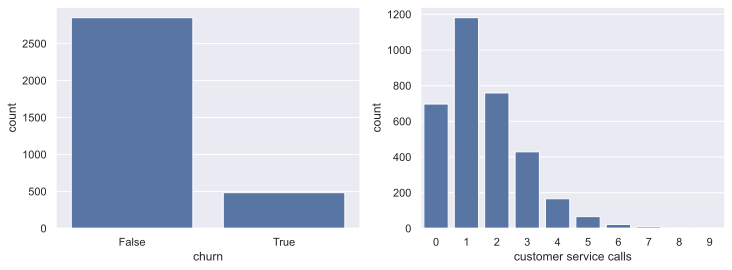

In [11]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
sns.countplot(x="churn", data=df, ax=axes[0])
sns.countplot(x="customer service calls", data=df, ax=axes[1]);

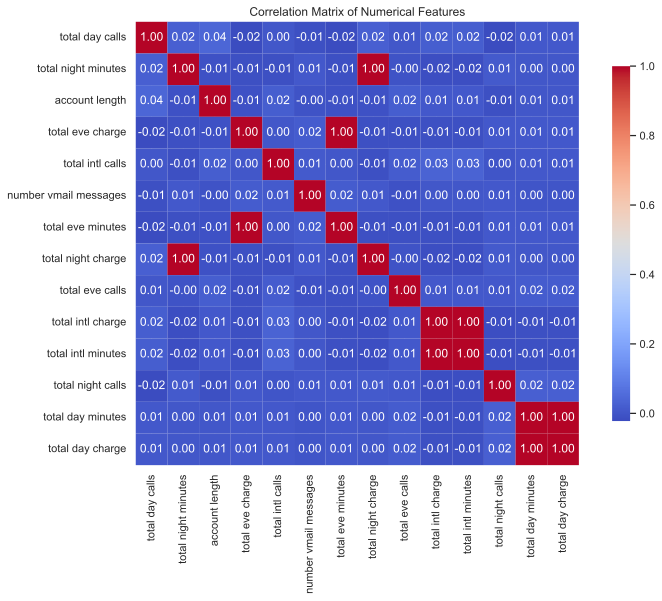

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is already defined and contains your data

# Drop non-numerical variables (correcting the case of column names)
numerical = list(
    set(df.columns)
    - set(
        [
            "state",  # Corrected to lowercase
            "international plan",  # Corrected to lowercase
            "voice mail plan",  # Corrected to lowercase
            "area code",  # Corrected to lowercase
            "churn",  # Corrected to lowercase
            "customer service calls",  # Corrected to lowercase
            "phone number"
        ]
    )
)

# Calculate the correlation matrix
corr_matrix = df[numerical].corr()

# Set the figure size and plot the heatmap
plt.figure(figsize=(12, 8))  # Adjust figure size for better visibility
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, cbar_kws={"shrink": .8})

# Set title
plt.title("Correlation Matrix of Numerical Features")
plt.show()  # Display the heatmap

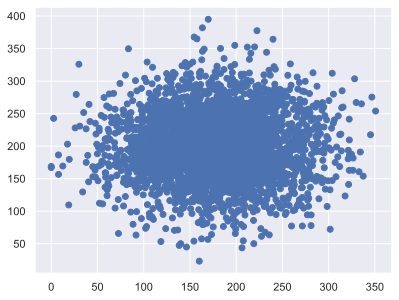

In [13]:
plt.scatter(df["total day minutes"], df["total night minutes"]);

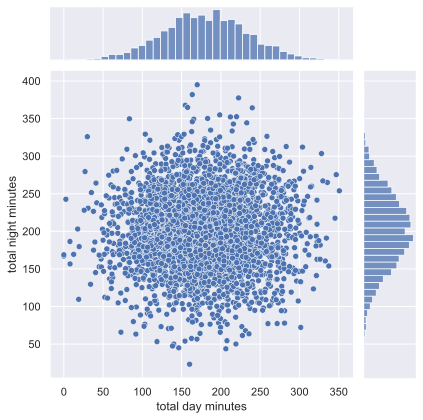

In [14]:
 sns.jointplot(x="total day minutes", y="total night minutes", data=df, kind="scatter");

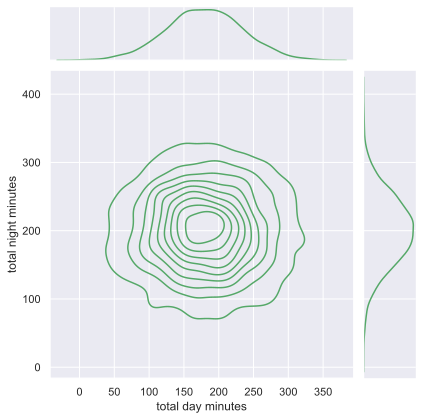

In [15]:
 sns.jointplot(x="total day minutes", y="total night minutes", data=df, kind="kde", color="g");

E:\anaconda\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


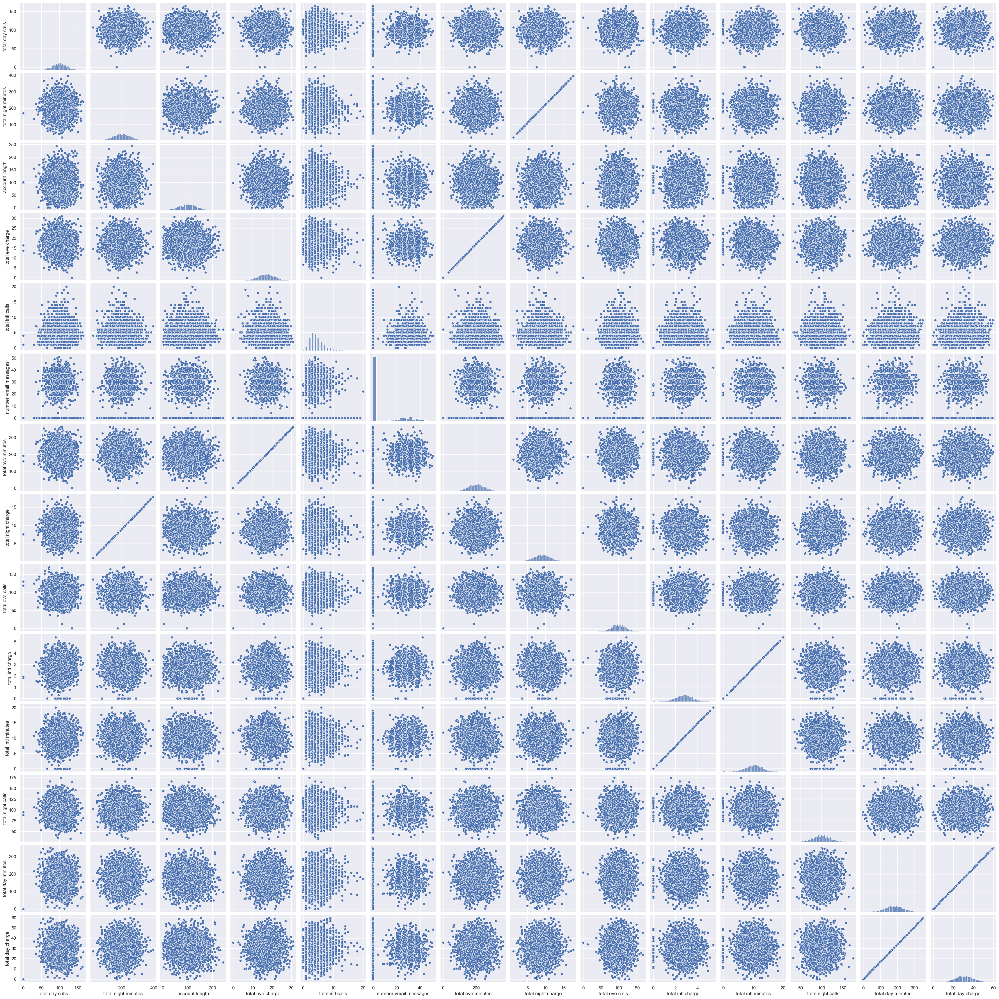

In [16]:
 # `pairplot()` may become very slow with the SVG format
 %config InlineBackend.figure_format = 'png'
 sns.pairplot(df[numerical]);

In [17]:
%config InlineBackend.figure_format = 'svg'

E:\anaconda\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


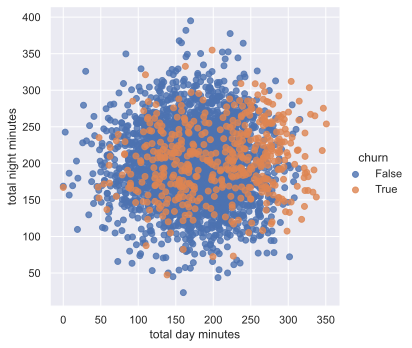

In [18]:
sns.lmplot(x="total day minutes", y="total night minutes", data=df, hue="churn", fit_reg=False);

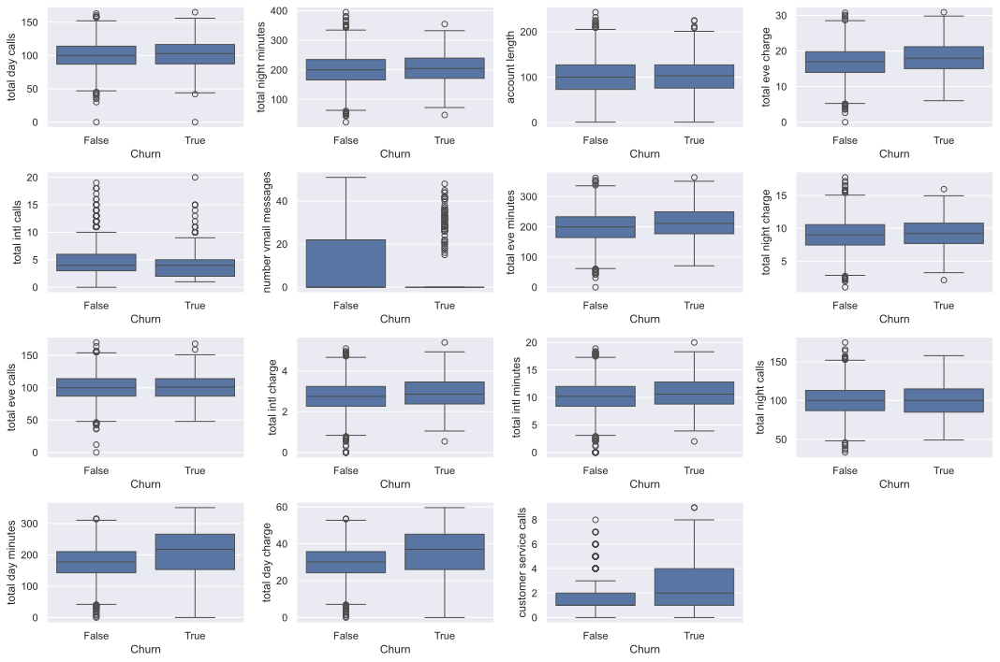

In [19]:
# Add "customer service calls" to numerical list for analysis
numerical.append("customer service calls")

# Calculate number of rows required for a 4-column layout
n_cols = 4
n_rows = (len(numerical) + n_cols - 1) // n_cols  # This ensures enough rows

# Set up the grid of subplots with a larger figure size for readability
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 10))

# Flatten axes to make it easier to iterate through them
axes = axes.flatten()

# Loop through each feature in the numerical list and plot a boxplot
for idx, feat in enumerate(numerical):
    sns.boxplot(x="churn", y=feat, data=df, ax=axes[idx])
    axes[idx].set_xlabel("Churn")  # Set x-axis label for clarity
    axes[idx].set_ylabel(feat)  # Set y-axis label as feature name

# Turn off any unused axes
for i in range(idx + 1, len(axes)):
    axes[i].axis("off")

# Adjust layout to prevent overlapping
fig.tight_layout()
plt.show()


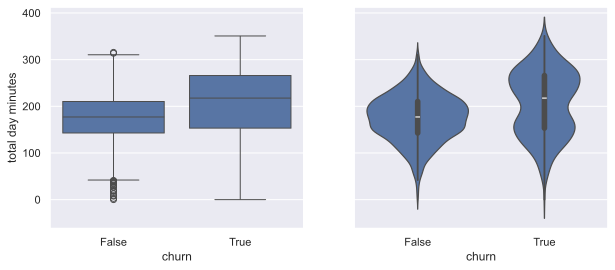

In [20]:
 _, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))
 sns.boxplot(x="churn", y="total day minutes", data=df, ax=axes[0])
 sns.violinplot(x="churn", y="total day minutes", data=df, ax=axes[1]);

E:\anaconda\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


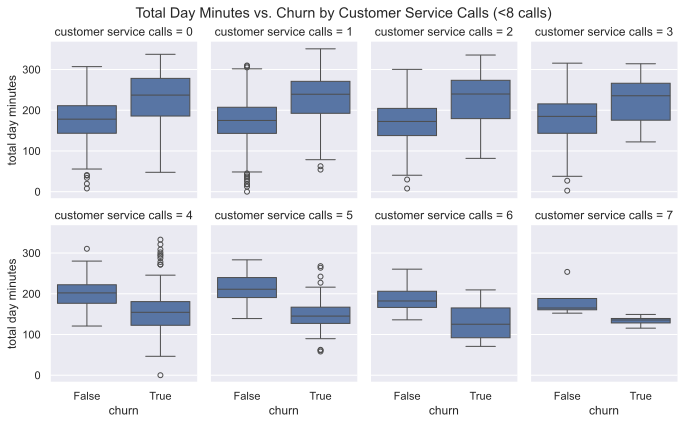

In [21]:
# Box plot of 'Total day minutes' vs 'Churn', with each plot for different levels of 'Customer service calls'
sns.catplot(
    x="churn",
    y="total day minutes",
    col="customer service calls",
    data=df[df["customer service calls"] < 8],  # Only for calls < 8
    kind="box",
    col_wrap=4,  # Wrap columns to fit the grid nicely
    height=3,    # Height of each subplot
    aspect=0.8   # Aspect ratio
)

plt.subplots_adjust(top=0.9)  # Adjust top to add space for title
plt.suptitle("Total Day Minutes vs. Churn by Customer Service Calls (<8 calls)")  # Overall title
plt.show()


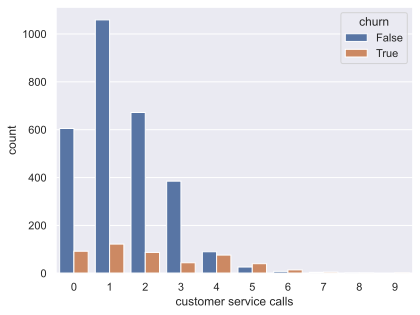

In [22]:
sns.countplot(x="customer service calls", hue="churn", data=df);

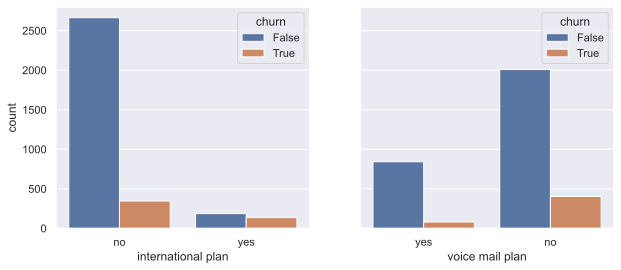

In [23]:
 _, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))
sns.countplot(x="international plan", hue="churn", data=df, ax=axes[0])
sns.countplot(x="voice mail plan", hue="churn", data=df, ax=axes[1]);

In [24]:
pd.crosstab(df["state"], df["churn"]).T

state,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
churn,,,,,,,,,,,,,,,,,,,,,
False,49,72,44,60,25,57,62,49,52,55,...,52,48,54,62,72,65,52,71,96,68
True,3,8,11,4,9,9,12,5,9,8,...,8,5,18,10,5,8,14,7,10,9


In [25]:
 df.groupby(["state"])["churn"].agg(["mean"]).sort_values(by="mean", ascending=False).T

state,NJ,CA,TX,MD,SC,MI,MS,NV,WA,ME,...,RI,WI,IL,NE,LA,IA,VA,AZ,AK,HI
mean,0.264706,0.264706,0.25,0.242857,0.233333,0.219178,0.215385,0.212121,0.212121,0.209677,...,0.092308,0.089744,0.086207,0.081967,0.078431,0.068182,0.064935,0.0625,0.057692,0.056604


In [26]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [27]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Drop unnecessary columns and convert relevant ones to numeric
x = df.drop(columns=["churn", "state"])

# Map categorical variables to numeric
x["international plan"] = x["international plan"].map({"Yes": 1, "No": 0})
x["voice mail plan"] = x["voice mail plan"].map({"Yes": 1, "No": 0})

# Convert all columns to numeric where possible
x = x.apply(pd.to_numeric, errors='coerce')  # Converts non-numeric values to NaN

# Optional: Remove columns that are entirely NaN
x = x.dropna(axis=1, how='all')

# Optional: Remove rows with any NaN values
# x = x.dropna()

# Now, we can scale the data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Check the shape of x_scaled
# print(x_scaled.shape)


In [28]:
%%time
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(x_scaled)

CPU times: total: 31.1 s
Wall time: 11.7 s


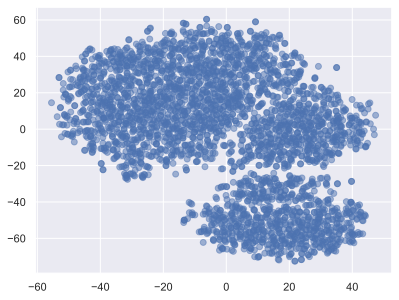

In [29]:
 plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5);

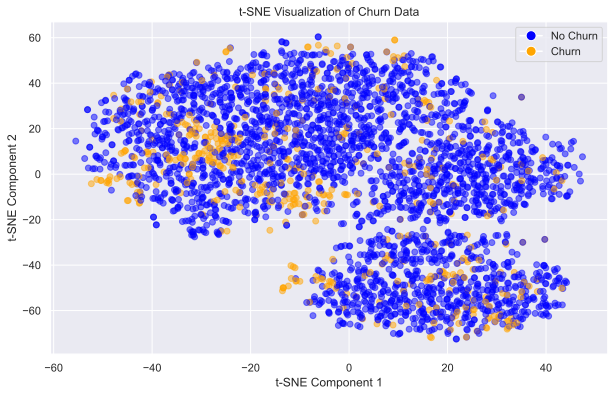

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming `tsne_repr` is already computed
plt.figure(figsize=(10, 6))  # Set the figure size for better visibility

plt.scatter(
    tsne_repr[:, 0],
    tsne_repr[:, 1],
    c=df["churn"].map({False: "blue", True: "orange"}),  # Color based on Churn
    alpha=0.5
)

plt.title('t-SNE Visualization of Churn Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.grid(True)
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', label='No Churn', markerfacecolor='blue', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Churn', markerfacecolor='orange', markersize=10)
])
plt.show()


Plotting for: international plan
Plotting for: voice mail plan


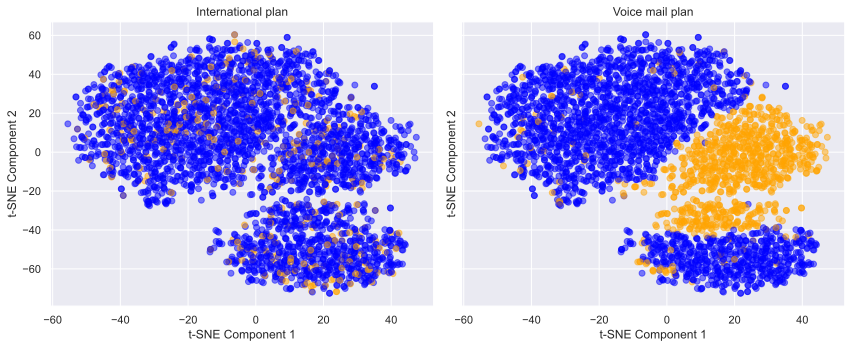

In [31]:
import matplotlib.pyplot as plt

# Create subplots
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

# Loop through the specified features and create scatter plots
for i, name in enumerate(["international plan", "voice mail plan"]):  # Use lowercase names
    print(f"Plotting for: {name}")
    axes[i].scatter(
        tsne_repr[:, 0],
        tsne_repr[:, 1],
        c=df[name].map({"yes": "orange", "no": "blue"}),  # Use lowercase values for mapping
        alpha=0.5,
    )
    axes[i].set_title(name.capitalize())  # Capitalize the title for better readability
    axes[i].set_xlabel('t-SNE Component 1')  # Set x-axis label
    axes[i].set_ylabel('t-SNE Component 2')  # Set y-axis label

plt.tight_layout()  # Adjusts the subplots to fit into the figure area.
plt.show()  # Display the plot
